# Lasio, Welly & PetroPy

## Lasio

I will compare the plotting process for a .las file using these three libraries. Let´s start with lasio, first we have to import this library and some other useful ones.

In [15]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import lasio

Let´s load the well data. I am using well data provided by the University of Kansas.

In [24]:
#This is how you import a .las file in lasio
las = lasio.read('sample.las')

Now you can see how Lasio reads your file and stores it on a lasio object

In [25]:
las

Let´s handle this object using pandas

In [26]:
df = las.df()
df.tail()

,GR,RILD,RILM,RLL3,RXORT,SP,AVTX,BVTX,CNPOR,DCAL,DPOR,RHOB,RHOC,MEL15,MEL20
DEPT,,,,,,,,,,,,,,,
4457.0,NaN,100000.0,194.8602,4.2376,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,3.6451,3.8981
4458.0,NaN,NaN,1698.1981,5.5501,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,-0.2939,-0.8869
4459.0,NaN,NaN,100000.0000,19.9900,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4460.0,NaN,NaN,100000.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4461.0,NaN,NaN,100000.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We will only care about some columns of this dataframe. These columns will be: Gamma Ray, Density Porosity, Bulk Density and Spontaneous Potential 

In [27]:
selected_columns = ['GR','SP','DPOR','RHOB']
df_shorter = df[selected_columns]
df_shorter.tail()

,GR,SP,DPOR,RHOB
DEPT,,,,
4457.0,NaN,NaN,NaN,NaN
4458.0,NaN,NaN,NaN,NaN
4459.0,NaN,NaN,NaN,NaN
4460.0,NaN,NaN,NaN,NaN
4461.0,NaN,NaN,NaN,NaN


As you can see, there are lots of NaN values on this dataframe, let´s check the statistics about this.

In [28]:
df_shorter.isna().sum()

GR        37
SP        37
DPOR    3547
RHOB    3548
dtype: int64

The data from DPOR and RHOB is not good at all, so we will only focus on GR and SP logs

In [29]:
df_clean = df_shorter.dropna(subset=['GR', 'SP'],axis=0, how='any')
df_clean

,GR,SP,DPOR,RHOB
DEPT,,,,
5.0,173.0200,98.7936,NaN,NaN
6.0,165.2808,106.5173,NaN,NaN
7.0,161.9301,103.5069,NaN,NaN
8.0,158.1227,101.1132,NaN,NaN
9.0,161.0781,98.0247,NaN,NaN
...,...,...,...,...
4420.0,31.2882,14.6007,14.2447,2.4664
4421.0,24.6118,12.8567,11.8658,2.5071
4422.0,10.4928,11.5515,13.4777,2.4795


Let´s check the general statistics of the dataframe:

In [30]:
df_clean.describe()

,GR,SP,DPOR,RHOB
count,4420.000000,4420.000000,925.000000,925.000000
mean,56.627640,0.128209,11.334731,2.516161
std,29.353544,38.941027,6.637420,0.113501
min,0.000000,-70.587800,-1.632000,1.905800
25%,37.286100,-30.690150,6.606900,2.457100
50%,53.065350,-3.979450,9.942500,2.539800
75%,68.586850,14.027000,14.789900,2.597000
max,304.824400,129.839000,47.029000,2.737900


To describe the data accurately, we should normalize it first. With a for loop we can complete this task faster:

In [31]:
df_clean.describe().GR['mean']

56.62764015837104

In [46]:
df_normal = df_clean.copy()

for column in df_clean.describe().columns:
    df_normal = df_clean[(df_clean[column] > df_clean.describe()[column]['min']) & (df_clean[column] <= df_clean.describe()[column]['max'])]
df_normal

,GR,SP,DPOR,RHOB
DEPT,,,,
3500.0,39.1956,-52.5757,18.3904,2.3955
3501.0,42.7852,-54.3015,18.1641,2.3994
3502.0,45.2251,-54.2723,17.5965,2.4091
3503.0,52.1936,-52.2536,16.2070,2.4329
3504.0,49.0451,-48.5917,12.4393,2.4973
...,...,...,...,...
4420.0,31.2882,14.6007,14.2447,2.4664
4421.0,24.6118,12.8567,11.8658,2.5071
4422.0,10.4928,11.5515,13.4777,2.4795


To make a simple visual comparison between the 'Clean' data and the 'Normalized' data, let´s plot them:

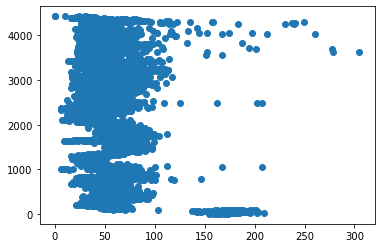

In [47]:
#Clean Data
plt.scatter(df_clean['GR'],df_clean.index)

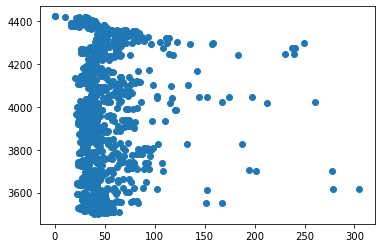

In [34]:
#Normalized Data
plt.scatter(df_normal['GR'],df_normal.index)

Now the only thing left to do is to plot the well logs:

In [51]:
df_normal = df_normal.rename_axis('DEPTH').reset_index()

In [52]:
df_normal

,DEPTH,GR,SP,DPOR,RHOB
0,3500.0,39.1956,-52.5757,18.3904,2.3955
1,3501.0,42.7852,-54.3015,18.1641,2.3994
2,3502.0,45.2251,-54.2723,17.5965,2.4091
3,3503.0,52.1936,-52.2536,16.2070,2.4329
4,3504.0,49.0451,-48.5917,12.4393,2.4973
...,...,...,...,...,...
919,4420.0,31.2882,14.6007,14.2447,2.4664
920,4421.0,24.6118,12.8567,11.8658,2.5071
921,4422.0,10.4928,11.5515,13.4777,2.4795
922,4423.0,0.3026,14.4283,14.1650,2.4678


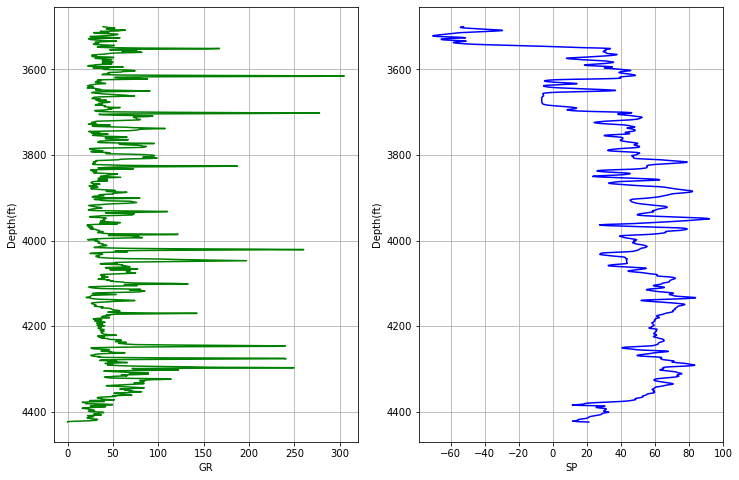

In [66]:
def plotter():
    f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,8))
    logs = ['GR','SP']
    colors = ['green','blue']
    for i,log,color in zip(range(2),logs,colors):
        ax[i].plot(df_normal[log], df_normal.DEPTH, color=color)
        ax[i].invert_yaxis()
        ax[i].set_xlabel(log)
        ax[i].set_ylabel("Depth(ft)")
        ax[i].grid()
plotter()

As you´ve seen this was not such a difficult task. We´ll see if it gets a little tougher using welly.

## Welly

In [67]:
from welly import Well

well = Well.from_las('sample.las')
well

Well(uwi: '15-135-26075-00-00', 15 curves: ['GR', 'RILD', 'RILM', 'RLL3', 'RXORT', 'SP', 'AVTX', 'BVTX', 'CNPOR', 'DCAL', 'DPOR', 'RHOB', 'RHOC', 'MEL15', 'MEL20'])

Simple as that. Welly makes the work pretty easy.

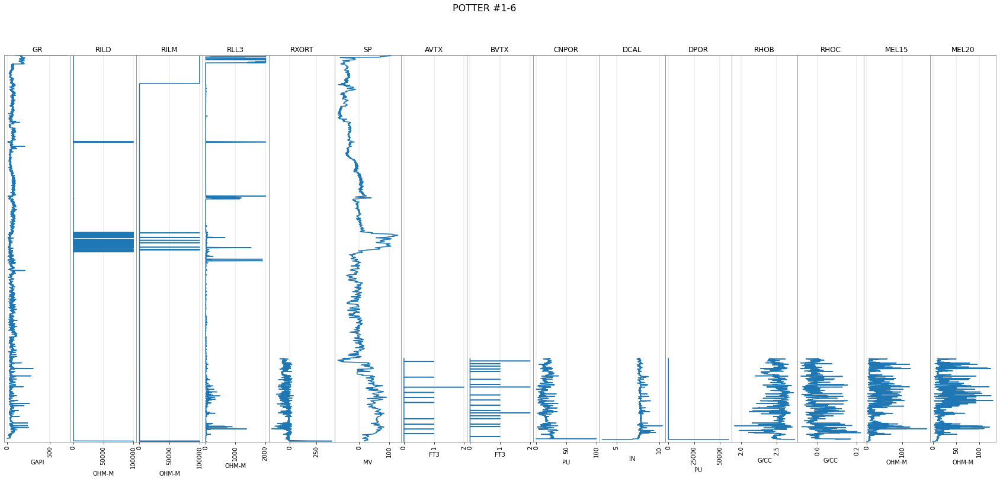

In [68]:
well.plot()

This is how, with a simple line of code, we get a general view of all the logs on our .las file

In welly, each log is treated like a 'Curve' object, and we can get access to it´s features easily:

In [76]:
well.data

{'GR': Curve([535.0327, 513.4084, 499.2635, ...,      nan,      nan,      nan]),
 'RILD': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'RILM': Curve([    nan,     nan,     nan, ..., 100000., 100000., 100000.]),
 'RLL3': Curve([  nan,   nan,   nan, ..., 19.99,   nan,   nan]),
 'RXORT': Curve([nan, nan, nan, ...,  0., nan, nan]),
 'SP': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'AVTX': Curve([nan, nan, nan, ...,  0., nan, nan]),
 'BVTX': Curve([nan, nan, nan, ...,  0., nan, nan]),
 'CNPOR': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'DCAL': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'DPOR': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'RHOB': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'RHOC': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'MEL15': Curve([nan, nan, nan, ..., nan, nan, nan]),
 'MEL20': Curve([nan, nan, nan, ..., nan, nan, nan])}

In [79]:
well.data['SP']

Curve([nan, nan, nan, ..., nan, nan, nan])

## Petropy

With petropy we can simply load our logs using ptr.Log and then ptr.LogViewer, but first let´s take a look at the CurveItems that petropy generates from our data

In [25]:
import petropy as ptr
las_file_path = 'sample.las'
log = ptr.Log(las_file_path)
log.curves


[CurveItem(mnemonic=DEPT, unit=FT, value=0 000 00 00, descr=Depth, original_mnemonic=DEPT, data.shape=(4484,)),
 CurveItem(mnemonic=GR, unit=GAPI, value=, descr=Gamma Ray, original_mnemonic=GR, data.shape=(4484,)),
 CurveItem(mnemonic=RILD, unit=OHM-M, value=, descr=DIL Deep Resistivity, original_mnemonic=RILD, data.shape=(4484,)),
 CurveItem(mnemonic=RILM, unit=OHM-M, value=, descr=DIL Medium Resistivity, original_mnemonic=RILM, data.shape=(4484,)),
 CurveItem(mnemonic=RLL3, unit=OHM-M, value=, descr=DIL Shallow Resistivity, original_mnemonic=RLL3, data.shape=(4484,)),
 CurveItem(mnemonic=RXORT, unit=, value=, descr=Rxo / Rt, original_mnemonic=RXORT, data.shape=(4484,)),
 CurveItem(mnemonic=SP, unit=MV, value=, descr=DIL Spontaneous Potential, original_mnemonic=SP, data.shape=(4484,)),
 CurveItem(mnemonic=AVTX, unit=FT3, value=, descr=Annular Volume Ticks, original_mnemonic=AVTX, data.shape=(4484,)),
 CurveItem(mnemonic=BVTX, unit=FT3, value=, descr=Borehole Volume Ticks, original_mne

In [33]:
viewer = ptr.LogViewer(log,top = 6950, height = 100)

ValueError: Curve PE_N not found in log.

When we try to view our log, an error that says that there is a missing curve pops on the screen. 
This is because ptr.LogViewer uses XML templates, if any curve is missing it pops a ValueError.


Let´s try with a sample dataset that comes with the library. We have to use ptr.log_data

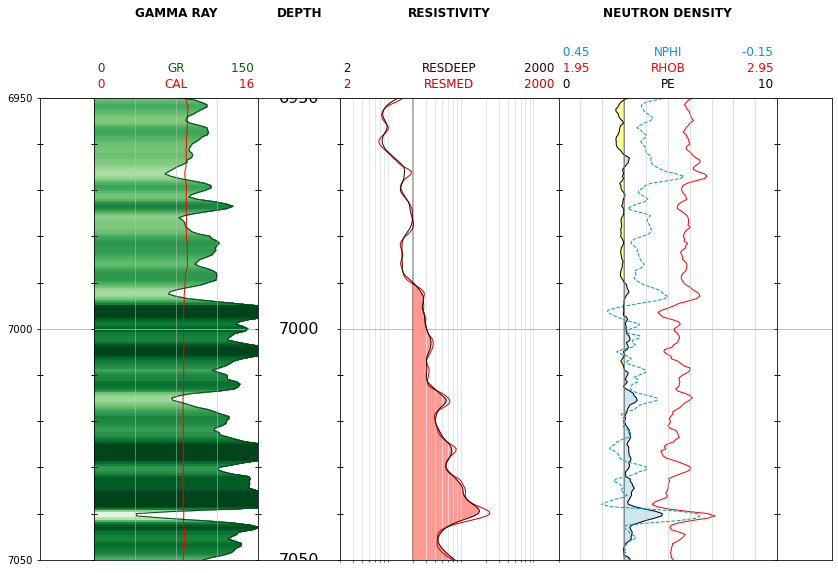

In [31]:
log_sample = ptr.log_data('WFMP')
viewer_sample = ptr.LogViewer(log_sample,top = 6950, height = 100)

In [27]:
log_sample.curves 

[CurveItem(mnemonic=DEPT, unit=F, value=00 000 00 00, descr=1  Depth Curve, original_mnemonic=DEPT, data.shape=(13047,)),
 CurveItem(mnemonic=CALI, unit=INCH, value=99 075 22 05, descr=2  CALIPER, original_mnemonic=CALI, data.shape=(13047,)),
 CurveItem(mnemonic=DPHI, unit=DECP, value=99 075 22 05, descr=3  DENSITY POROSITY -LIME-, original_mnemonic=DPHI, data.shape=(13047,)),
 CurveItem(mnemonic=GR, unit=GAPI, value=99 075 22 05, descr=4  GAMMA RAY, original_mnemonic=GR, data.shape=(13047,)),
 CurveItem(mnemonic=NPHI, unit=DECP, value=99 075 22 05, descr=5  NEUTRON POROSITY -LIME-, original_mnemonic=NPHI, data.shape=(13047,)),
 CurveItem(mnemonic=PE, unit=B/E, value=99 075 22 05, descr=6  PHOTO-ELECTRIC FACTOR, original_mnemonic=PE, data.shape=(13047,)),
 CurveItem(mnemonic=RHOB, unit=G/C3, value=99 075 22 05, descr=7  BULK DENSITY, original_mnemonic=RHOB, data.shape=(13047,)),
 CurveItem(mnemonic=PHIX, unit=DECP, value=99 075 22 05, descr=8  CROSSPLOT POROSITY, original_mnemonic=PHIX

As you have seen, the quality of the graphic is quite good. This library produces graphics that are attractive for the viewer.

---

By: Arturo Ruiz Sánchez. Universidad Nacional Autónoma de México